# An Analysis of the Non-Linear Wave Equation with Periodic Forcing 

## Import Packages 

In [2]:
using LinearAlgebra
using DifferentialEquations
using SparseArrays
using FFTW 
using BenchmarkTools 
using Plots 

## Section 1: Introduction 

Here we study the scalar second-order wave equation with periodic forcing. We include damping and non-linear terms.

<b>Problem to solve</b> Let $x \in \Omega=(0,1)$ denote the spatial domain. Let $t \in [0,T]$ denote the time interval. Let $c$ denote the velocity of wave propagation. Let $\gamma$ denote the friction coefficient. Let $f(t)$ denote the periodic forcing (observe that we assume here that the function $f(t)$ is $x$-independent). The partial differential equation we intend to solve can be written as 

$$
\frac{\partial^2 \, u}{\partial t^2} + \gamma \frac{\partial \, u}{\partial t} 
= c^2 \frac{\partial^2 \, u}{\partial x^2} + f(t) 
$$ 

(observe the plus sign in front of $\gamma$ and square of propagation speed). Non-linear terms will be added later. We supply periodic boundary condition for $u(x,t)$ and $\dot{u}(x,t)$, i.e., we impose that 

$$
u(0,t) = u(1,t) \text{ and } \dot{u}(0,t) = \dot{u}(1,t) \, . 
$$

We impose non-zero initial conditions for $u(x,t)$ and zero initial conditions for $\dot{u}(x,t)$, i.e., we impose that

$$
u(x,0) = u_0(x) \text{ and } \dot{u}(x,0) = 0 \, . 
$$

A <b>reference solution</b> can be computed using seperation of variables (implemented symbolically, using e.g. sympy) or using the method of manufactured solutions. 

For the <b>spatial discretization</b>, we use the central finite difference method on an uniform mesh with $N+1$ nodes (including both boundary nodes). We refer to the [EE4375 course](https://github.com/ziolai/finite_element_electrical_engineering) for details. After spatial discretization, the following system of second order ordinary differential equations is obtained 

$$
\ddot{\mathbf{u}}(t) = \mathbf{F}(\mathbf{u},\dot{\mathbf{u}}, t) \in {\mathbb R}^{N+1}
$$ 

where $\mathbf{F}(\mathbf{u},t)$ contains both linear and non-linear terms. This systems is supplied with initial conditions for both $\mathbf{u}(t=0)$ and $\dot{\mathbf{u}}(t=0)$. This system of ordinary differential eqautions can be solved using time-integration or harmonic balancing. 

<b>Scenarios to consider</b>: 
1. non-zero initial position, zero initial velocity, and zero external forcing. Periodic boundary conditions are enforced. Analytical solution known. 
2. add damping. Expect solution to die out;
3. add periodic external forcing acting on the entire computational domain (independent of $x$). Expect frequency of forcing to appear in frequency spectra; 
4. add non-linear terms. Expect frequency content to increase;

## Section 2: Analytical Solution for Zero Forcing 

The analytical solution can be found using patience, seperation of variables and Fourier series decomposition. We refer to [Section 7.4 of Vajiac Lecture Notes](https://www.math.hmc.edu/~ajb/PCMI/lecture7.pdf) (has minor typo in the definition of $\omega_n$) among possible other sources. This reference considers a standing wave solution. Homogeneous Dirichlet boundary conditions are employed on both sides of the computational domain. 

Any analytical solution can be verified setting setting the damping coefficient $\gamma = 0$. If we set $u(x,t) = \cos(\omega_n \, t) \, \sin(n\,\pi\,x)$, then $u_{xx}(x,t) = - n^2 \, \pi^2 \, u(x,t)$ and $u_{tt}(x,t) = \omega^2 \, \cos(\omega \, t)$. The function is thus a solution in case that $\omega_n = n \, \pi$. 

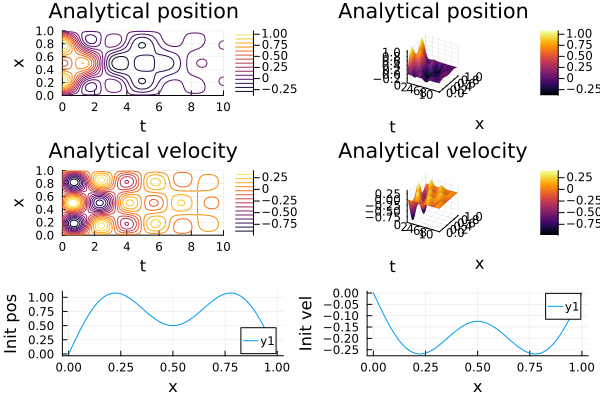

In [4]:
function genAnalyticalSolution(x,t,cosTModeAmp,c,gamma)
    
    nnodes = length(x) 
    Ntp1   = length(t)
    Nmodes = length(cosTModeAmp)
    
    uanal = zeros(nnodes,Ntp1)
    vanal = zeros(nnodes,Ntp1)
    modes = Vector(1:1:Nmodes)
    
    #..construct mode dependent vectors.. 
    alpha = [ c*n*π for n in modes]
    omega = sqrt.(alpha.^2 .- (gamma/2).^2)

    #..construct set of spatial basis vectors.. 
    X = reduce(hcat,[sin.(n*π*x) for n in modes])

    #..construct set of temporal basis vectors.. 
    CT = reduce(hcat,[exp.(-gamma/2*t).*cos.(omega[n]*t) for n in modes])
    ST = reduce(hcat,[exp.(-gamma/2*t).*sin.(omega[n]*t) for n in modes])
    
    CBasis = [ X[:,n] * Transpose(CT[:,n]) for n in modes]
    SBasis = [ X[:,n] * Transpose(ST[:,n]) for n in modes]
    
    for n in modes uanal = uanal + cosTModeAmp[n] * CBasis[n] end 
    for n in modes vanal = vanal + (-gamma/2*cosTModeAmp[n]) * CBasis[n] + (-omega[n]*cosTModeAmp[n]) * SBasis[n] end 
    
    return uanal, vanal
end 

# set number of elements in space, the number of time samples and number of modes 
nelements = 100;
Nt = 1000; 
Nmodes = 10; 
modes = Vector(1:1:Nmodes)

#..construct the 1D spatial x-mesh and the spatial modes 
nnodes = nelements+1; h = 1/nelements; h2=h*h; 
x = Vector(0:h:1); 
X = reduce(hcat,[sin.(n*π*x) for n in modes])

#..construct temporal t-mesh  
Tend = 10; dt = Tend/Nt; 
t = Vector(0:dt:Tend);

#..set wave velocity and damping coefficients 
c = .2;
gamma = 0.5 # 0.5 

#..construct vector of Fourier mode indices in time domain 
cosTModeAmp = zeros(size(modes))
cosTModeAmp[1] = 1; cosTModeAmp[3] = 0.5 

#..initialize and construct analytical solution 
uanal, vanal = genAnalyticalSolution(x,t,cosTModeAmp,c,gamma)

#..initialize and construct initialize position and velocity  
Vinit = zeros(nnodes); Vtinit = zeros(nnodes);
for n in modes Vinit  = Vinit  + cosTModeAmp[n] * X[:,n] end 
for n in modes Vtinit = Vtinit + (-gamma/2)*cosTModeAmp[n] * X[:,n] end 

p1 = contour(t,x,uanal)
xlabel!("t") 
ylabel!("x")
title!("Analytical position")
p2 = surface(t,x,uanal)
xlabel!("t") 
ylabel!("x")
title!("Analytical position")
p3 = contour(t,x,vanal)
xlabel!("t") 
ylabel!("x")
title!("Analytical velocity")
p4 = surface(t,x,vanal)
xlabel!("t") 
ylabel!("x")
title!("Analytical velocity")
p5 = plot(x,Vinit)
xlabel!("x") 
ylabel!("Init pos")
p6 = plot(x,Vtinit)
xlabel!("x") 
ylabel!("Init vel")

plot(p1,p2,p3,p4,p5,p6,layout=(3,2))

## Section 3: Second Analytical Solution (to be worked out)
Here we assume periodic boundary conditions plus a normalization constant. 

Assume that $X_n(x) = c_n \, \cos(n \, \pi \, x) + s_n \, \sin(n \, \pi \, x)$. Assume that $(C_1): X_n(0) = X_n(1)$ and that $(C_2): \int_0^1 X_n(x) \, dx = C$. Then $(C_1): $

## Section 4: Analytical Solution: Spectral Analysis using Fast-Fourier Transform

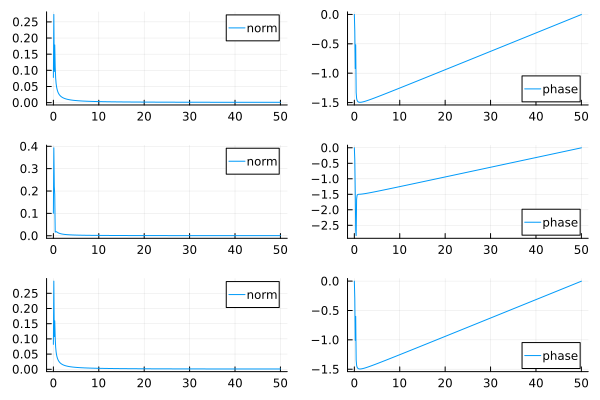

In [6]:
uanalp1 = uanal[div(nelements,4),:]
uanalp2 = uanal[div(nelements,2),:]
uanalp3 = uanal[3*div(nelements,4),:]

p1 = plot(t,uanalp1)
p2 = plot(t,uanalp2)
p3 = plot(t,uanalp3)

plot(p1,p2,p3,layout=(3,1))

# perform FFT of sampled position data 
uanalfp1 = fft(uanalp1)
uanalfp2 = fft(uanalp2)
uanalfp3 = fft(uanalp3)

#..set frequency axis 
fmax = 1/(2.0*dt)
fstep = 2*fmax/Nt
fvec = Vector(0:fstep:fmax)

#..plot absolute value of FFT samples  
p1 = plot(fvec, 2.0/Nt * abs.(uanalfp1[1:length(fvec)]),label="norm")
p2 = plot(fvec, angle.(uanalfp1[1:length(fvec)]),label="phase")
p3 = plot(fvec, 2.0/Nt * abs.(uanalfp2[1:length(fvec)]),label="norm")
p4 = plot(fvec, angle.(uanalfp2[1:length(fvec)]),label="phase")
p5 = plot(fvec, 2.0/Nt * abs.(uanalfp3[1:length(fvec)]),label="norm")
p6 = plot(fvec, angle.(uanalfp3[1:length(fvec)]),label="phase")
plot(p1, p2, p3, p4, p5, p6, layout = (3,2))

## Section 5: Spatial Discretization: Construct the One-Dimensional Matrix

In [15]:
# struct to hold entire mesh
struct Mesh
  #..number of nodes of the mesh..   
  nnodes::Int64
  #..number of elements of the mesh..
  nelements::Int64 
  #..vector of x-coordinates of nodes of the mesh..
  Nodes::Vector{Float64}
end 

# function to generate a mesh on the interval 0 <= x <= 1.   
# we limit the type of input to be Int64 
function genMesh(nelements::Int64)::Mesh
    h = 1/nelements 
    nnodes = nelements+1
    Nodes = Vector{Float64}(0:h:1)    
    mesh = Mesh(nnodes,nelements,Nodes)     
    return mesh;
end 

# generate global stiffness matrix 
function genStiffMat(mesh::Mesh)

    #..recover number of elements and nodes  
    nelements = mesh.nelements
    nnodes    = nelements+1
    
    #..set mesh width and square of mesh width 
    h = 1/nelements; h2=h*h; 

    #..construct the coefficient matrix with our the boundary conditions 
    e = ones(nnodes); #..note that ones(N+1,1) does *not* work here 
    A = Tridiagonal(-e[2:end], 2*e, -e[2:end]); 
    A = (1/h2)*A;     
   
    return A; 
    
end

function genVector(mesh, sourceFct::F) where F 

    #..recover mesh nodes  
    nodes = mesh.Nodes
    
    #..set vector values using broadcasting (dot syntax)  
    f = sourceFct.(nodes)
   
    return f; 
end

function genBoundaries(mesh,A)
    
    #..recover number of elements and nodes  
    nelements = mesh.nelements
    nnodes = mesh.nnodes 
    
    #..set mesh width and square of mesh width 
    h = 1/nelements; h2=h*h; 
    
    #..set homogeneous Dirichlet boundary conditions at both end points  
    if (true)
        display(" Setting homogeneous Dirichet conditions on both sides")
        A[1,1] = 0.; A[1,2] = 0.; 
        A[end,end] = 0.; A[end,end-1] = 0.;
    elseif (false)
        #..set homogeneous Dirichlet left and homogeneous Neumann right
        display(" Setting homogeneous Neumann conditions on the right hand side:: Option-1")
        A[1,1] = 1.;        A[1,2] = 0.;         
        A[end,end] = 1/h ;  A[end,end-1] = -1/h;      
    elseif (false)
        #..set homogeneous Dirichlet left and homogeneous Neumann right
        display(" Setting homogeneous Neumann conditions on the right hand side:: Option-2")
        A[1,1] = 1.;        A[1,2] = 0.;         
        A[end,end] = 1/h ;  A[end,end-1] = -1/h;       
    elseif (false)
        display(" Setting periodic boundary conditions:: Option-1")
        A = sparse(A)
        A[1,end-1] = -1/h2; 
        A[end,2]   = -1/h2;
    elseif (true)
        display(" Setting periodic boundary conditions:: Option-2")
        A = sparse(A)
        A[1,end-1] = -1/h2; 
        [A[end,i] = -1. for i =1:nnodes];        
    else 
        error(" genSolution::Error::Boundary conditions not set")
    end 
    return A  
end

genBoundaries (generic function with 1 method)

In [16]:
mesh = genMesh(nelements); A = genStiffMat(mesh); A = genBoundaries(mesh,A); A = -A;

" Setting homogeneous Dirichet conditions on both sides"

In [17]:
display(A)

101×101 Tridiagonal{Float64, Vector{Float64}}:
    -0.0      -0.0        ⋅         ⋅   …        ⋅         ⋅        ⋅ 
 10000.0  -20000.0   10000.0        ⋅            ⋅         ⋅        ⋅ 
      ⋅    10000.0  -20000.0   10000.0           ⋅         ⋅        ⋅ 
      ⋅         ⋅    10000.0  -20000.0           ⋅         ⋅        ⋅ 
      ⋅         ⋅         ⋅    10000.0           ⋅         ⋅        ⋅ 
      ⋅         ⋅         ⋅         ⋅   …        ⋅         ⋅        ⋅ 
      ⋅         ⋅         ⋅         ⋅            ⋅         ⋅        ⋅ 
      ⋅         ⋅         ⋅         ⋅            ⋅         ⋅        ⋅ 
      ⋅         ⋅         ⋅         ⋅            ⋅         ⋅        ⋅ 
      ⋅         ⋅         ⋅         ⋅            ⋅         ⋅        ⋅ 
      ⋅         ⋅         ⋅         ⋅   …        ⋅         ⋅        ⋅ 
      ⋅         ⋅         ⋅         ⋅            ⋅         ⋅        ⋅ 
      ⋅         ⋅         ⋅         ⋅            ⋅         ⋅        ⋅ 
     ⋮                        

## Section 6: Time Integration of the (Non-)Linear Problem
Review how boundary conditions are imposed. 

In [20]:
function wave_system(ddu,du,u,p,t)
    Fd = 2*u.*du.*(u.>0) - 2*u.*du.*(u.<0) 
    Fd = abs.(du).*du 
    # c^2*A*u  
    # c^2*A*u - gamma*du
    # c^2*A*u - u.*du
    ddu .= c^2*A*u  
    ddu[1] = 0
    ddu[end] = 0 
    # c^2*A*u - 10*Fd .+ 500*sin(2*π*3*t)
end
 
u0 = Vinit
u0[end] = 1.
v0 = Vtinit  

# tspan = (0.0,10)
tspan = (0.0,50)

prob = SecondOrderODEProblem(wave_system,v0,u0,tspan)
sol = solve(prob, AutoVern7(Rodas5()), reltol = 1e-8, abstol = 1e-8, save_everystep = true);
# sol = solve(prob, AutoVern7(Rodas5()), reltol = 1e-2, abstol = 1e-2, save_everystep = true);

In [22]:
velind = 1:nnodes; posind = nnodes+1:2*nnodes; 
Nt = length(sol.t)
V  = sol[velind,:]
p1 = contour(sol.t,x,V)
title!("Numerical velocity")
U  = sol[posind,:]
p2 = contour(sol.t,x,U)
title!("Numerical position")
# plot(p1, p2, layout= (1,2))
p3 = plot(sol[velind,div(Nt,4)],label="1/4 vel")
p4 = plot(sol[posind,div(Nt,4)],label="1/4 pos")
p5 = plot(sol[velind,div(Nt,2)],label="1/2 vel")
p6 = plot(sol[posind,div(Nt,2)],label="1/2 pos")
p7 = plot(sol[velind,3*div(Nt,4)],label="3/4 vel")
p8 = plot(sol[posind,3*div(Nt,4)],label="3/4 pos")
plot(p1, p2, p3, p4, p5, p6, p7, p8, layout = (4,2)) 

In [23]:
Vinit

101-element Vector{Float64}:
 0.0
 0.07846491573738545
 0.1564811768221757
 0.23360386633812896
 0.3093955099066432
 0.3834297149100042
 0.45529471207522293
 0.5245967682230308
 0.5909634401291992
 0.654046640854459
 0.7135254915624212
 0.7691089337472632
 0.8205380789176877
 ⋮
 0.7691089337472631
 0.7135254915624213
 0.6540466408544592
 0.590963440129199
 0.5245967682230306
 0.45529471207522365
 0.38342971491000494
 0.30939550990664355
 0.23360386633812924
 0.15648117682217644
 0.07846491573738532
 1.0

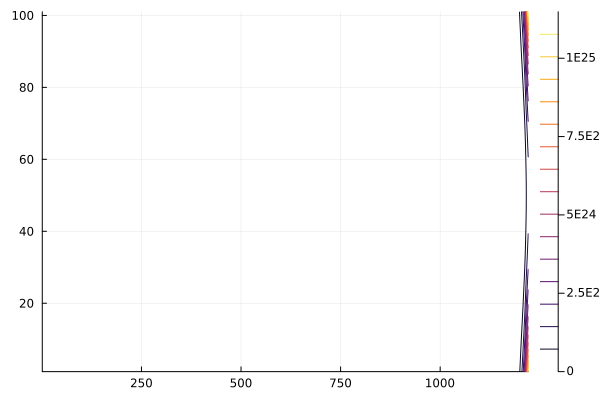

In [14]:
uanal, vanal = genAnalyticalSolution(x,sol.t,cosTModeAmp,c,gamma); 
contour(abs.(V - vanal))

## Section 7: Spectral Analysis for Time Traces 

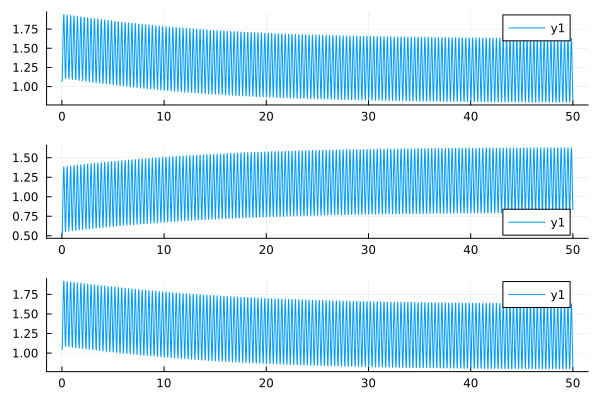

In [36]:
unump1 = U[div(nelements,4),:]
unump2 = U[div(nelements,2),:]
unump3 = U[div(3*nelements,4),:]

p1 = plot(sol.t,unump1)
p2 = plot(sol.t,unump2)
p3 = plot(sol.t,unump3)
plot(p1,p2,p3,layout=(3,1)) 

In [ ]:
# perform FFT of sampled position data 
unumfp1 = fft(unump1)
unumfp2 = fft(unump2)
unumfp3 = fft(unump3)

#..set frequency axis 
fmax = 1/(2.0*dt)
fstep = 2*fmax/Nt
fvec = Vector(0:fstep:fmax)

#..plot absolute value of FFT samples  
p1 = plot(fvec, 2.0/Nt * abs.(unumfp3[1:length(fvec)]),label="norm")
p2 = plot(fvec, angle.(unumfp3[1:length(fvec)]),label="phase")
plot(p1, p2)

## Section 8: Sandbox 

### Formulation as System of Coupled Equations 

In progress at [notebook on system-first-order-wave](./system-first-order-wave.ipynb).

### Scalar Linear and Non-Linear First Order PDE in 1D Space and Time: Burgers Equation 

Problem formulation: linear scalar wave equation with constant velocity $c_0$ given by $u_t(x,t) + c_0 u_x(x,t) = 0$ for $0 \leq x \leq 1$ and $0 \leq t \leq T$ supplied with periodic boundary conditions $u(0,t) = u(1,t)$ and initial conditions $u(x,t=0) = u_0(x)$.

Solve analytically: method of characteristics. Set $\xi = x - c_0 t$. Then $u_x = u_{\xi}$ and $u_t = - c_0 u_{\xi}$. Any function $u(\xi) = u(x - c_0 t)$ is solution. This function represents a profile (wave) moving from left to right.  

Solve using e.g. finite difference or finite volume method in space (uniform mesh is fine) followed by time integration applied to the semi-discrete (discrete in space and continuous in time) system. You can build time-integration routine from scratch or use DifferentialEquations.jl. Alternatively, use out-of-the box solutions such as [trixi.jl](https://trixi-framework.github.io). Expect numerical dispersion to occur unless some form of diffusion is added to the equations.  

Repeat above for heat equation $u_t = u_{xx}$ plus boundary and initial conditions. 

Repeat above for linear convection-diffusion equation $u_t + c_0 u_x(x,t) = u_{xx}$ plus boundary and initial conditions.

Repeat above for non-linear convection-diffusion equation $u_t + u \, u_x(x,t) = u_{xx}$ plus boundary and initial conditions. The transport term is non-linear.

[Burgers Eqn Example](https://docs.sciml.ai/SciMLBenchmarksOutput/html/MOLPDE/burgers_spectral_wpd.html)

## References 

1. Seperation of variables applied to the damped wave equation [lecture notes](https://www.math.hmc.edu/~ajb/PCMI/lecture7.pdf); 
2. Example of non-linear acoustics [model](https://www.comsol.com/model/nonlinear-propagation-of-a-cylindrical-wave-verification-model-88771); 